In [2]:
import pandas as pd
import numpy as np
from collections import Counter # used for counting the occurrences of elements in a collection.

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import seaborn as sea
import plotly.express as px
from scipy.stats import pearsonr
from sklearn.impute import SimpleImputer

from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.preprocessing import MultiLabelBinarizer

#supervised
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB

# model evaluation & tuning hyperparameter
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

# metrics
from sklearn import metrics
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report, precision_score,recall_score, roc_auc_score

#unsupervised
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering #hierarchical
import scipy.cluster.hierarchy as sch
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score #evaluate the quality of a clustering by calculating the Calinski-Harabasz Index
from sklearn.cluster import DBSCAN

from tabulate import tabulate #pretty-print tabular data.
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn import metrics
from mpl_toolkits.mplot3d import Axes3D

import warnings
import os
warnings.filterwarnings("ignore")

# Introduction

Develop a sophisticated system to analyze and predict air quality in a large metropolitan area, incorporating multiple pollutants, various data sources, and complex environmental factors. 

# 1- Data Collection and Preprocessing

# a) Download datasets from the provided sources.

In [7]:
air_data= pd.read_excel(r'C:\Users\haifa\Albayrak Internship\Projects\Final\Air_Data.xlsx')

In [8]:
weather_data= pd.read_excel(r'C:\Users\haifa\Albayrak Internship\Projects\Final\Weather_Data.xlsx')

In [9]:
transportation_data= pd.read_excel(r'C:\Users\haifa\Albayrak Internship\Projects\Final\transportation.xlsx')

# b) Clean each dataset:

- Air Quality

In [12]:
air_data.shape

(363, 11)

In [13]:
air_data.columns

Index(['Date', 'Source', 'State', 'Latitude', 'Longitude', 'PM2.5', 'PM10',
       'NO2', 'Ozone', 'SO2', 'CO'],
      dtype='object')

In [14]:
air_data.head()

,Date,Source,State,Latitude,Longitude,PM2.5,PM10,NO2,Ozone,SO2,CO
0,2023-01-01 00:00:00,AirNow,Alabama,33.553056,-86.815,8.6,18,16.5,0.039,0.4,0.2
1,2023-02-01 00:00:00,AirNow,Alabama,33.553056,-86.815,9.7,17,9.6,0.025,0.5,0.3
2,2023-03-01 00:00:00,AirNow,Alabama,33.553056,-86.815,5.6,13,9.9,0.027,0.3,0.2
3,2023-04-01 00:00:00,AirNow,Alabama,33.553056,-86.815,4.3,17,29.6,0.040,0.6,0.5
4,2023-05-01 00:00:00,AirNow,Alabama,33.553056,-86.815,3.7,14,31.8,0.042,0.8,0.6


In [15]:
air_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 11 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       363 non-null    object 
 1   Source     363 non-null    object 
 2   State      363 non-null    object 
 3   Latitude   363 non-null    float64
 4   Longitude  363 non-null    float64
 5   PM2.5      359 non-null    float64
 6   PM10       363 non-null    int64  
 7   NO2        359 non-null    float64
 8   Ozone      363 non-null    float64
 9   SO2        359 non-null    float64
 10  CO         359 non-null    float64
dtypes: float64(7), int64(1), object(3)
memory usage: 31.3+ KB


From the information above we can conclude that columns CO, SO2, PM2.5 and NO2 contains some missing values.

In [17]:
# Check for missing values
air_data.isnull().sum()

Date         0
Source       0
State        0
Latitude     0
Longitude    0
PM2.5        4
PM10         0
NO2          4
Ozone        0
SO2          4
CO           4
dtype: int64

In [18]:
# Check for duplicates
air_data.duplicated().sum()

0

In [19]:
# Provide a basic statistical summary of the dataset
air_data.describe()

,Latitude,Longitude,PM2.5,PM10,NO2,Ozone,SO2,CO
count,3.630000e+02,3.630000e+02,359.000000,363.000000,359.000000,363.000000,359.00000,359.000000
mean,3.355306e+01,-8.681500e+01,8.808914,27.556474,20.970474,0.042614,7.48273,0.332591
std,1.280742e-13,5.407578e-13,4.758788,13.803234,9.155626,0.009849,12.29905,0.128471
min,3.355306e+01,-8.681500e+01,-0.200000,7.000000,4.000000,0.010000,0.10000,0.100000
25%,3.355306e+01,-8.681500e+01,5.300000,18.000000,13.100000,0.036000,1.00000,0.200000
50%,3.355306e+01,-8.681500e+01,8.200000,25.000000,20.600000,0.043000,1.80000,0.300000
75%,3.355306e+01,-8.681500e+01,11.100000,34.000000,28.400000,0.049000,7.25000,0.400000
max,3.355306e+01,-8.681500e+01,26.800000,110.000000,46.000000,0.080000,72.70000,0.900000


In [20]:
# Handle missing values by fill in in the missing values with the mean value of each column
imputer = SimpleImputer(strategy='mean')
air_data[['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']] = imputer.fit_transform(air_data[['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']])

In [21]:
#check again the missing values
air_data.isnull().sum()

Date         0
Source       0
State        0
Latitude     0
Longitude    0
PM2.5        0
PM10         0
NO2          0
Ozone        0
SO2          0
CO           0
dtype: int64

In [22]:
# Define numerical features for outlier check
air_data_columns =['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']

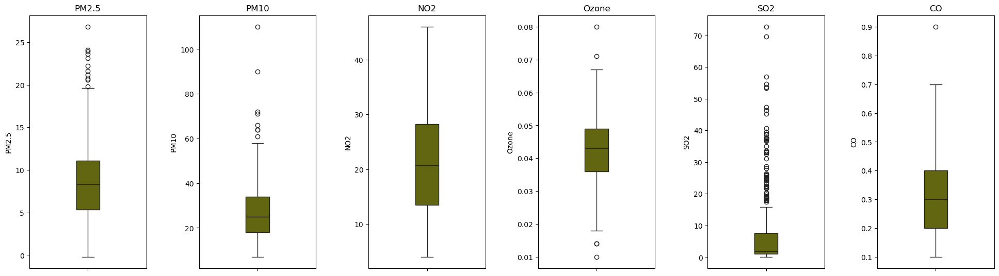

In [23]:
# Plot boxplots to visually inspect outliers
fig, axes = plt.subplots(1, len(air_data_columns), figsize=(20, 6))
for i, feature in enumerate(air_data_columns):
    sea.boxplot(y=air_data[feature], orient="v", color="#6f7501", width=0.2, ax=axes[i])
    axes[i].set_title(feature)
fig.tight_layout(pad=3.0)
plt.show()

In [24]:
# Remove outliers
def remove_outliers(df, columns):
    for col in columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        df = df[(df[col] >= Q1 - 1.5 * IQR) & (df[col] <= Q3 + 1.5 * IQR)]
    return df

In [25]:
# Remove outliers from air_data
air_data_cleaned = remove_outliers(air_data, air_data_columns)

In [26]:
# Display the number of rows before and after removing outliers
print(f"Air Data: {len(air_data)} rows before, {len(air_data_cleaned)} rows after removing outliers.")

Air Data: 363 rows before, 281 rows after removing outliers.


- Weather Data

In [28]:
weather_data.shape

(363, 8)

In [29]:
weather_data.columns

Index(['Date', 'Source', 'State', 'Latitude', 'Longitude', 'Humidity',
       'WindSpeed', 'Temperature'],
      dtype='object')

In [30]:
weather_data.head()

,Date,Source,State,Latitude,Longitude,Humidity,WindSpeed,Temperature
0,2023-01-01 00:00:00,AirNow,Alabama,33.553056,-86.815,73.0,2.6,17.2
1,2023-02-01 00:00:00,AirNow,Alabama,33.553056,-86.815,80.0,4.2,18.4
2,2023-03-01 00:00:00,AirNow,Alabama,33.553056,-86.815,86.0,5.8,18.1
3,2023-04-01 00:00:00,AirNow,Alabama,33.553056,-86.815,55.0,4.1,14.4
4,2023-05-01 00:00:00,AirNow,Alabama,33.553056,-86.815,57.0,3.3,8.9


In [31]:
weather_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 363 entries, 0 to 362
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Date         363 non-null    object 
 1   Source       363 non-null    object 
 2   State        363 non-null    object 
 3   Latitude     363 non-null    float64
 4   Longitude    363 non-null    float64
 5   Humidity     335 non-null    float64
 6   WindSpeed    363 non-null    float64
 7   Temperature  363 non-null    float64
dtypes: float64(5), object(3)
memory usage: 22.8+ KB


From the information above we can conclude that Humdidty column contains some missing values.

In [33]:
# Check for missing values
weather_data.isnull().sum()

Date            0
Source          0
State           0
Latitude        0
Longitude       0
Humidity       28
WindSpeed       0
Temperature     0
dtype: int64

In [34]:
# Check for duplicates
weather_data.duplicated().sum()

0

In [35]:
# Provide a basic statistical summary of the dataset
weather_data.describe()

,Latitude,Longitude,Humidity,WindSpeed,Temperature
count,3.630000e+02,3.630000e+02,335.000000,363.000000,363.000000
mean,3.355306e+01,-8.681500e+01,70.561194,2.892562,17.870248
std,1.280742e-13,5.407578e-13,12.238706,1.239375,7.597310
min,3.355306e+01,-8.681500e+01,42.000000,0.600000,0.900000
25%,3.355306e+01,-8.681500e+01,62.000000,1.900000,12.200000
50%,3.355306e+01,-8.681500e+01,70.000000,2.600000,18.400000
75%,3.355306e+01,-8.681500e+01,80.000000,3.700000,24.500000
max,3.355306e+01,-8.681500e+01,97.000000,8.000000,30.300000


In [36]:
# Handle missing values by fill in in the missing values with the mean value of each column
imputer = SimpleImputer(strategy='mean')
weather_data[['Humidity', 'WindSpeed', 'Temperature']] = imputer.fit_transform(weather_data[['Humidity', 'WindSpeed', 'Temperature']])

In [37]:
#check again the missing values
weather_data.isnull().sum()

Date           0
Source         0
State          0
Latitude       0
Longitude      0
Humidity       0
WindSpeed      0
Temperature    0
dtype: int64

In [38]:
# Define numerical features for outlier check
weather_data_columns =['Humidity', 'WindSpeed', 'Temperature']

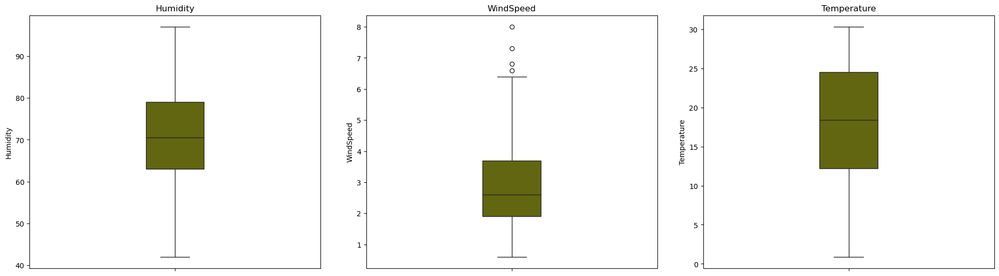

In [39]:
# Plot boxplots to visually inspect outliers
fig, axes = plt.subplots(1, len(weather_data_columns), figsize=(20, 6))
for i, feature in enumerate(weather_data_columns):
    sea.boxplot(y=weather_data[feature], orient="v", color="#6f7501", width=0.2, ax=axes[i])
    axes[i].set_title(feature)
fig.tight_layout(pad=3.0)
plt.show()

In [40]:
# Remove outliers from air_data
weather_data_cleaned = remove_outliers(weather_data, weather_data_columns)

In [41]:
print(f"Weather Data: {len(weather_data)} rows before, {len(weather_data_cleaned)} rows after removing outliers.")

Weather Data: 363 rows before, 359 rows after removing outliers.


- Transportation Data

In [43]:
transportation_data.shape

(1, 7)

In [44]:
transportation_data.head()

,State,Urban ( miles),Suburban(miles),Rural(miles),Urban(trip),Suburban(trip),Rural(trip)
0,Alabama,31.75,45.2184,52.9793,4.73359,5.5705,5.52623


In [45]:
transportation_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   State            1 non-null      object 
 1   Urban ( miles)   1 non-null      float64
 2   Suburban(miles)  1 non-null      float64
 3   Rural(miles)     1 non-null      float64
 4   Urban(trip)      1 non-null      float64
 5   Suburban(trip)   1 non-null      float64
 6   Rural(trip)      1 non-null      float64
dtypes: float64(6), object(1)
memory usage: 188.0+ bytes


# c) Integrate datasets based on location and timestamp.

In [47]:
# Normalize numerical features
scaler = StandardScaler()
# Normalize the numerical features in the cleaned air data
air_data_cleaned[['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']] = scaler.fit_transform(air_data_cleaned[['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']])
# Normalize the numerical features in the cleaned weather data
weather_data_cleaned[['Humidity', 'WindSpeed', 'Temperature']] = scaler.fit_transform(weather_data_cleaned[['Humidity', 'WindSpeed', 'Temperature']])

In [48]:
# Merge air and weather data on the common columns
merged_data = pd.merge(air_data_cleaned, weather_data_cleaned, on=['Date', 'Source', 'State', 'Latitude', 'Longitude'])

In [49]:
# Merge the transportation data
merged_data = pd.merge(merged_data, transportation_data, on='State')

# d) Create a unified dataset with consistent formatting.

In [51]:
# Display the first few rows of the unified dataset
print("Merged Data:")
merged_data.head()

Merged Data:


,Date,Source,State,Latitude,Longitude,PM2.5,PM10,NO2,Ozone,SO2,CO,Humidity,WindSpeed,Temperature,Urban ( miles),Suburban(miles),Rural(miles),Urban(trip),Suburban(trip),Rural(trip)
0,2023-01-01 00:00:00,AirNow,Alabama,33.553056,-86.815,0.111748,-0.658272,-0.453275,-0.333979,-0.691481,-0.974677,0.207374,-0.211593,-0.087161,31.75,45.2184,52.9793,4.73359,5.5705,5.52623
1,2023-02-01 00:00:00,AirNow,Alabama,33.553056,-86.815,0.386837,-0.746903,-1.207539,-1.901847,-0.662417,-0.183798,0.801400,1.171103,0.070343,31.75,45.2184,52.9793,4.73359,5.5705,5.52623
2,2023-03-01 00:00:00,AirNow,Alabama,33.553056,-86.815,-0.638495,-1.101430,-1.174745,-1.677866,-0.720546,-0.974677,1.310564,2.553798,0.030967,31.75,45.2184,52.9793,4.73359,5.5705,5.52623
3,2023-04-01 00:00:00,AirNow,Alabama,33.553056,-86.815,-0.963600,-0.746903,0.978733,-0.221988,-0.633352,1.397959,-1.320121,1.084684,-0.454669,31.75,45.2184,52.9793,4.73359,5.5705,5.52623
4,2023-05-01 00:00:00,AirNow,Alabama,33.553056,-86.815,-1.113649,-1.012799,1.219223,0.001993,-0.575223,2.188838,-1.150399,0.393336,-1.176561,31.75,45.2184,52.9793,4.73359,5.5705,5.52623


In [52]:
# Convert the 'Date' column to datetime format
merged_data['Date'] = pd.to_datetime(merged_data['Date'])

In [53]:
# Ensure all columns have consistent formatting (removing any leading/trailing spaces)
merged_data.columns = [col.strip() for col in merged_data.columns]

In [54]:
# Save the cleaned and merged dataset to a CSV file
merged_data.to_csv('Unified_Data.csv', index=False)

# 2- Exploratory Data Analysis (EDA):

# a) Perform univariate analysis on each feature

In [57]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 277 entries, 0 to 276
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Date             277 non-null    datetime64[ns]
 1   Source           277 non-null    object        
 2   State            277 non-null    object        
 3   Latitude         277 non-null    float64       
 4   Longitude        277 non-null    float64       
 5   PM2.5            277 non-null    float64       
 6   PM10             277 non-null    float64       
 7   NO2              277 non-null    float64       
 8   Ozone            277 non-null    float64       
 9   SO2              277 non-null    float64       
 10  CO               277 non-null    float64       
 11  Humidity         277 non-null    float64       
 12  WindSpeed        277 non-null    float64       
 13  Temperature      277 non-null    float64       
 14  Urban ( miles)   277 non-null    float64  

In [58]:
# Columns to plot for univariate analysis
merged_data_columns = ['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO', 'Humidity', 'WindSpeed', 'Temperature']

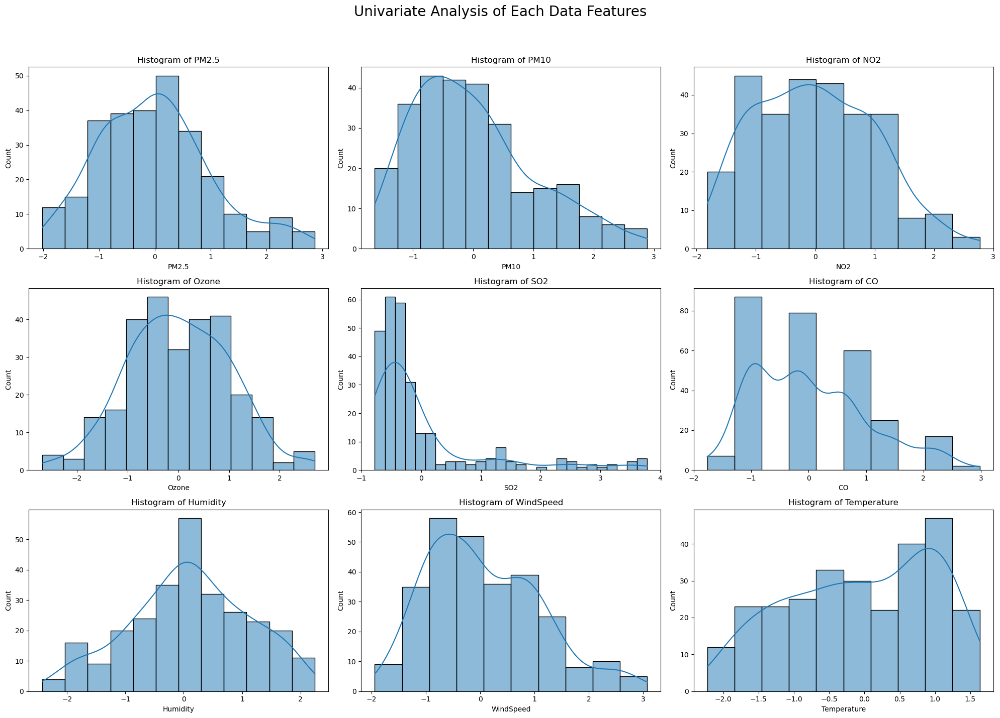

In [59]:
# Perform univariate analysis on each feature, plot histograms for specified columns
def plot_histograms(df, columns, title):
    plt.figure(figsize=(20, 15))
    for i, col in enumerate(columns, 1):
        plt.subplot(3, 3, i)
        sns.histplot(df[col], kde=True)
        plt.title(f'Histogram of {col}')
    plt.suptitle(title, fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()
# Plot histograms for merged data
plot_histograms(merged_data, merged_data_columns, 'Univariate Analysis of Each Data Features')

# b) Conduct bivariate analysis to explore relationships between variables

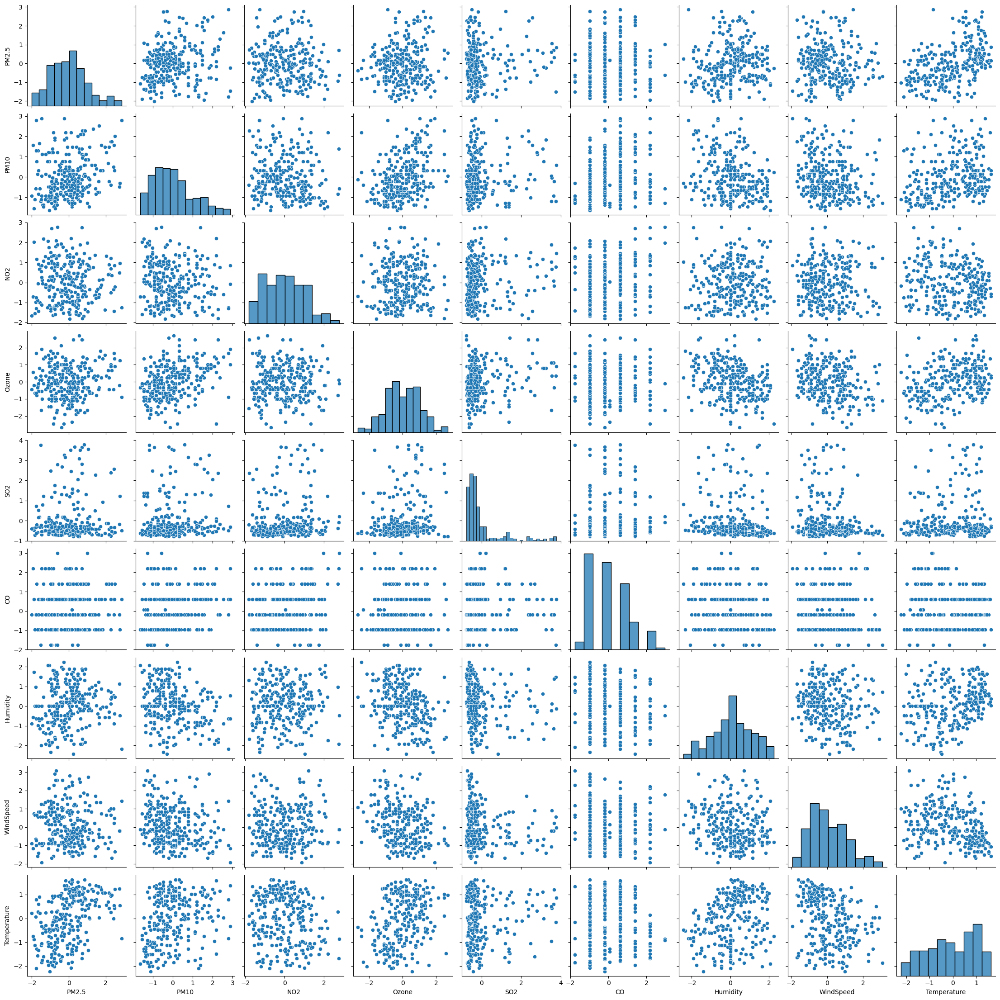

In [61]:
# Pairplot for numerical features,  Conduct bivariate analysis to explore relationships between variables.
sns.pairplot(merged_data[merged_data_columns])
plt.show()

# c) Create time series plots for pollutants and weather variables

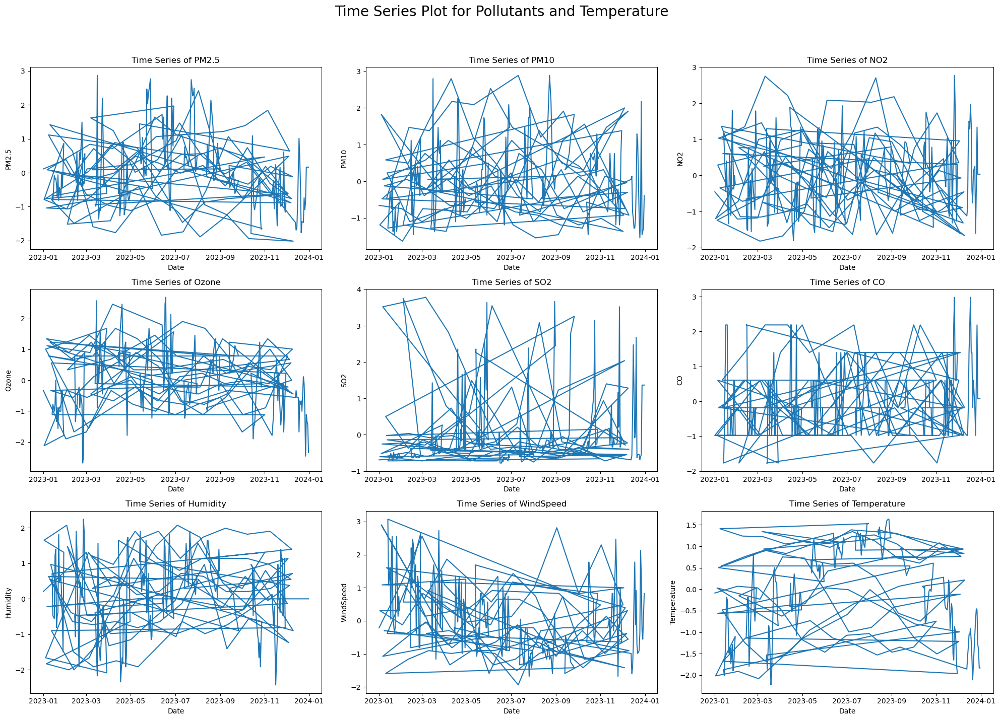

In [63]:
#Create time series plots for pollutants and weather variables.
def plot_time_series(df, columns, title):
    plt.figure(figsize=(20, 15))
    for i, col in enumerate(columns, 1):
        plt.subplot(3, 3, i)
        plt.plot(df['Date'], df[col])
        plt.title(f'Time Series of {col}')
        plt.xlabel('Date')
        plt.ylabel(col)
    plt.suptitle(title, fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Plot time series for merged data
plot_time_series(merged_data, merged_data_columns, 'Time Series Plot for Pollutants and Temperature')

# d) Generate heatmaps for spatial distribution of pollutants

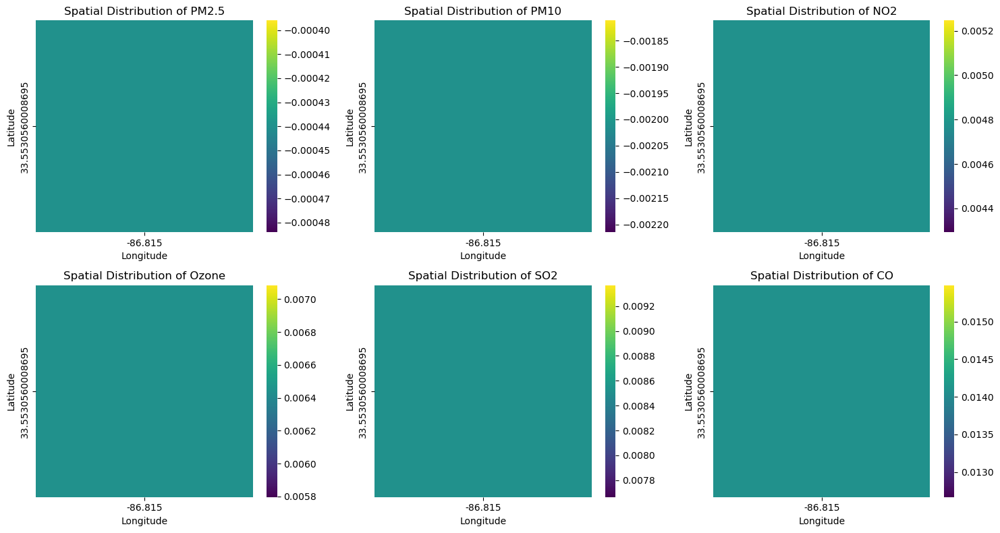

In [65]:
# Generate heatmaps for spatial distribution of pollutants.
plt.figure(figsize=(15, 8))
for i, feature in enumerate(['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']):
    plt.subplot(2, 3, i + 1)
    pivot_table = merged_data.pivot_table(values=feature, index='Latitude', columns='Longitude', aggfunc=np.mean)
    sns.heatmap(pivot_table, cmap='viridis')
    plt.title(f'Spatial Distribution of {feature}')
plt.tight_layout()
plt.show()

# e) Use advanced visualization libraries for interactive dashboards

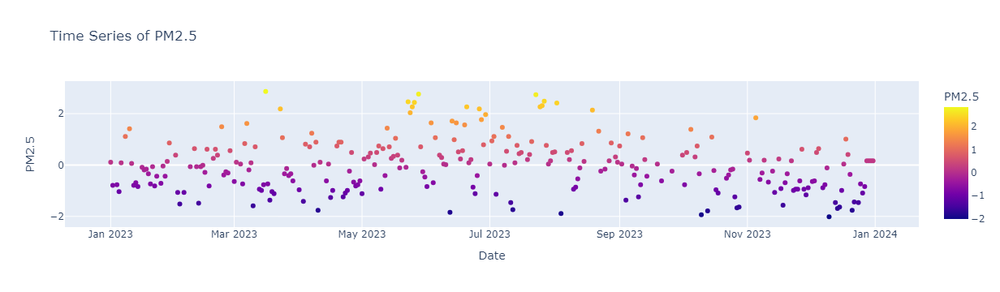

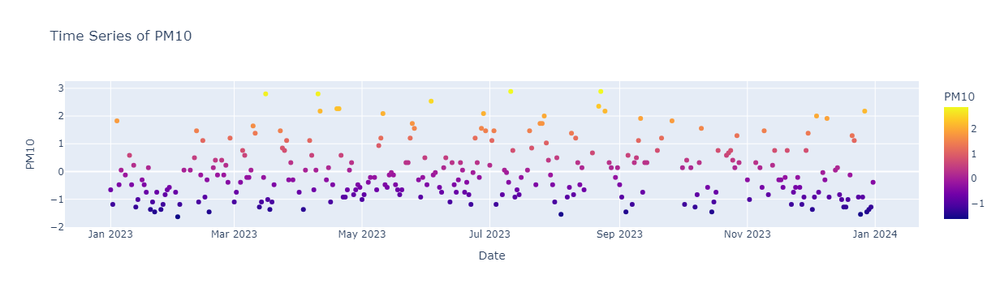

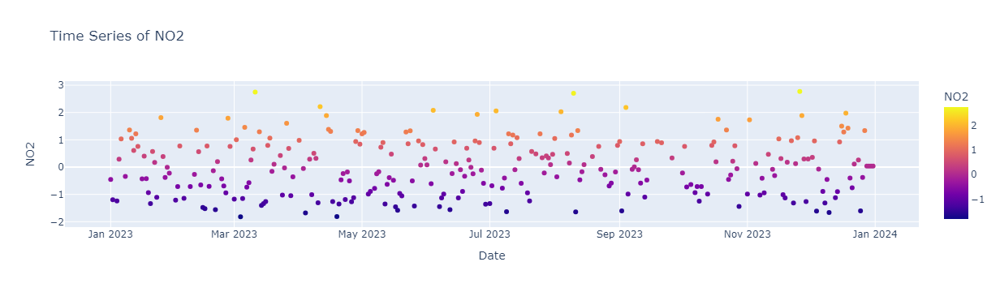

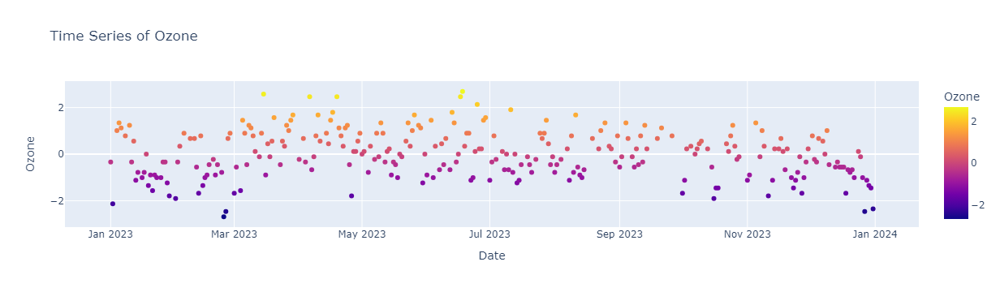

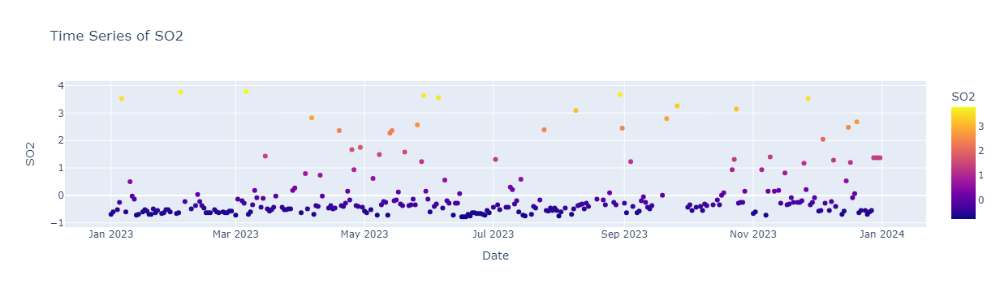

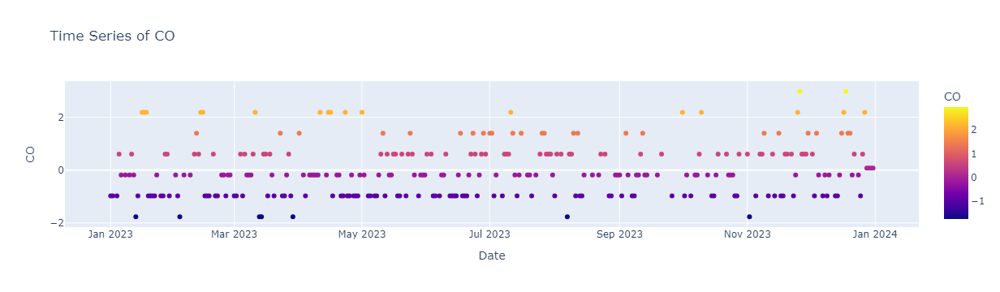

In [67]:
#Use advanced visualization libraries for interactive dashboards.
# Function to create interactive plots
def plot_interactive(df, x, y, color, title):
    fig = px.scatter(df, x=x, y=y, color=color, title=title)
    fig.show()
# plot for pollutants over time
for col in ['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']:
    plot_interactive(merged_data, 'Date', col, col, f'Time Series of {col}')

# f) Perform statistical tests to identify significant relationships

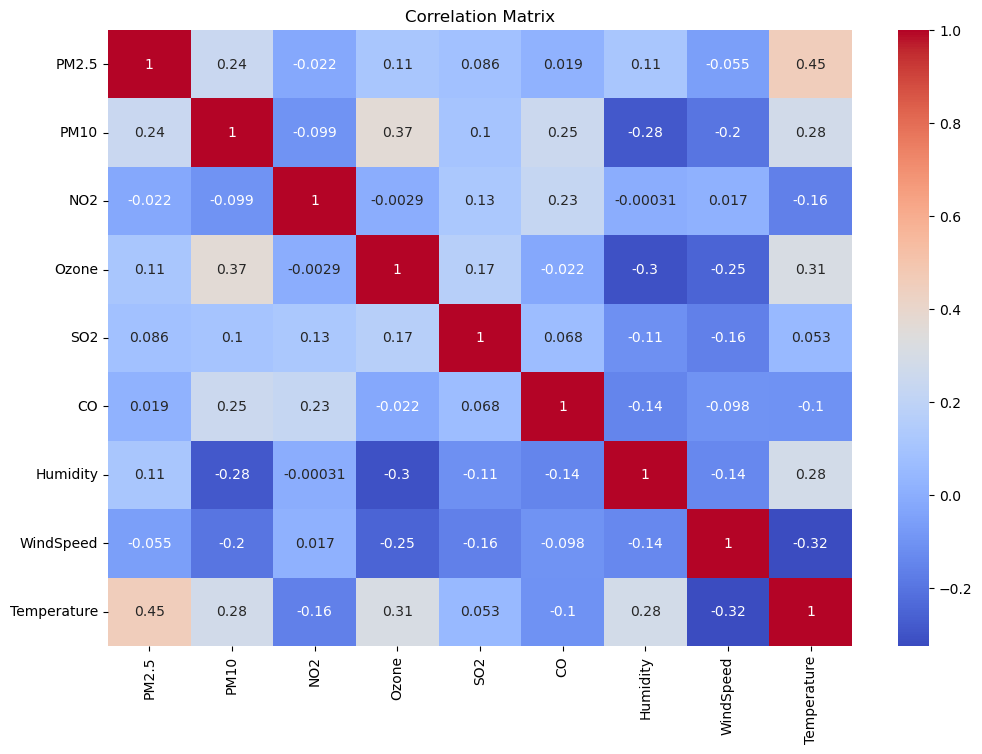

In [69]:
#Perform statistical tests to identify significant relationships
# Correlation matrix
correlation_matrix = merged_data[['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO', 'Humidity', 'WindSpeed', 'Temperature']].corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [70]:
# T-test between high and low pollutant levels for each weather variable
from scipy.stats import pearsonr, ttest_ind
def perform_ttest(df, pollutant, weather_variable):
    high_pollutant = df[df[pollutant] > df[pollutant].median()][weather_variable]
    low_pollutant = df[df[pollutant] <= df[pollutant].median()][weather_variable]
    t_stat, p_value = ttest_ind(high_pollutant, low_pollutant)
    return t_stat, p_value
# Perform t-tests
for pollutant in ['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']:
    for weather_var in ['Humidity', 'WindSpeed', 'Temperature']:
        t_stat, p_value = perform_ttest(merged_data, pollutant, weather_var)
        print(f'T-test between {pollutant} and {weather_var}: t-statistic = {t_stat}, p-value = {p_value}')

T-test between PM2.5 and Humidity: t-statistic = 2.616203908137426, p-value = 0.009382773070504164
T-test between PM2.5 and WindSpeed: t-statistic = -1.788404102988841, p-value = 0.07481158356683386
T-test between PM2.5 and Temperature: t-statistic = 7.4141669171159705, p-value = 1.5190243482265046e-12
T-test between PM10 and Humidity: t-statistic = -3.446685463047179, p-value = 0.0006562798562318009
T-test between PM10 and WindSpeed: t-statistic = -3.0684611136857565, p-value = 0.0023664436029709104
T-test between PM10 and Temperature: t-statistic = 4.587902037161144, p-value = 6.811143747136386e-06
T-test between NO2 and Humidity: t-statistic = -0.6738017486535806, p-value = 0.5010032998793976
T-test between NO2 and WindSpeed: t-statistic = -0.053817744425187504, p-value = 0.9571194472039632
T-test between NO2 and Temperature: t-statistic = -2.8590472702223777, p-value = 0.004574480743807297
T-test between Ozone and Humidity: t-statistic = -4.424898036523512, p-value = 1.392083680307

# 3-Feature Engineering:

# a) Create time-based features (hour, day, month, season)

In [73]:
# Create time-based features (hour, day, month, season).
# Convert InvoiceDate to datetime format
merged_data['Date'] = pd.to_datetime(merged_data['Date'])

In [74]:
merged_data['Hour'] = merged_data['Date'].dt.hour
merged_data['Day'] = merged_data['Date'].dt.day
merged_data['Month'] = merged_data['Date'].dt.month
merged_data['Season'] = merged_data['Date'].dt.month % 12 // 3 + 1

In [75]:
season_map = {1: 'Winter', 2: 'Spring', 3: 'Summer', 4: 'Fall'}
merged_data['Season'] = merged_data['Season'].map(season_map) # replacing the numeric values with the season names.

In [76]:
merged_data.head()

,Date,Source,State,Latitude,Longitude,PM2.5,PM10,NO2,Ozone,SO2,...,Urban ( miles),Suburban(miles),Rural(miles),Urban(trip),Suburban(trip),Rural(trip),Hour,Day,Month,Season
0,2023-01-01,AirNow,Alabama,33.553056,-86.815,0.111748,-0.658272,-0.453275,-0.333979,-0.691481,...,31.75,45.2184,52.9793,4.73359,5.5705,5.52623,0,1,1,Winter
1,2023-02-01,AirNow,Alabama,33.553056,-86.815,0.386837,-0.746903,-1.207539,-1.901847,-0.662417,...,31.75,45.2184,52.9793,4.73359,5.5705,5.52623,0,1,2,Winter
2,2023-03-01,AirNow,Alabama,33.553056,-86.815,-0.638495,-1.101430,-1.174745,-1.677866,-0.720546,...,31.75,45.2184,52.9793,4.73359,5.5705,5.52623,0,1,3,Spring
3,2023-04-01,AirNow,Alabama,33.553056,-86.815,-0.963600,-0.746903,0.978733,-0.221988,-0.633352,...,31.75,45.2184,52.9793,4.73359,5.5705,5.52623,0,1,4,Spring
4,2023-05-01,AirNow,Alabama,33.553056,-86.815,-1.113649,-1.012799,1.219223,0.001993,-0.575223,...,31.75,45.2184,52.9793,4.73359,5.5705,5.52623,0,1,5,Spring


# b) Develop lag features for time series data

In [78]:
# Develop lag features for time series data.
#1-Day Lag: Short-term, immediate past influence.
#7-Day Lag: Weekly patterns.
#30-Day Lag: Monthly trends or seasonality
#Using these different lags allows you to capture various temporal dependencies and patterns in the data, 
lags = [1, 7, 30]  # Days

In [79]:
for lag in lags:
    merged_data[f'PM2.5_lag{lag}'] = merged_data['PM2.5'].shift(lag)
    merged_data[f'PM10_lag{lag}'] = merged_data['PM10'].shift(lag)
    merged_data[f'NO2_lag{lag}'] = merged_data['NO2'].shift(lag)
    merged_data[f'Ozone_lag{lag}'] = merged_data['Ozone'].shift(lag)
    merged_data[f'SO2_lag{lag}'] = merged_data['SO2'].shift(lag)
    merged_data[f'CO_lag{lag}'] = merged_data['CO'].shift(lag)

In [80]:
# Display the new feature
merged_data.filter(like='_lag').head()

,PM2.5_lag1,PM10_lag1,NO2_lag1,Ozone_lag1,SO2_lag1,CO_lag1,PM2.5_lag7,PM10_lag7,NO2_lag7,Ozone_lag7,SO2_lag7,CO_lag7,PM2.5_lag30,PM10_lag30,NO2_lag30,Ozone_lag30,SO2_lag30,CO_lag30
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.111748,-0.658272,-0.453275,-0.333979,-0.691481,-0.974677,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.386837,-0.746903,-1.207539,-1.901847,-0.662417,-0.183798,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,-0.638495,-1.101430,-1.174745,-1.677866,-0.720546,-0.974677,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,-0.963600,-0.746903,0.978733,-0.221988,-0.633352,1.397959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [81]:
# Drop rows with NaN values due to lagging
merged_data.dropna(inplace=True)

# c) Calculate rolling averages over different time windows

In [83]:
# Rolling averages
for feature in ['PM2.5', 'PM10', 'NO2', 'Ozone', 'SO2', 'CO']:
    merged_data[f'{feature}_rolling_mean'] = merged_data[feature].rolling(window=7).mean()

In [84]:
# Calculate rolling averages over different time windows
# Rolling averages (or moving averages) smooth out short-term fluctuations and highlight longer-term trends or cycles in the data.
#A 7-day rolling average for a feature will be the average of the feature values over the past 7 days. window size
rolling_windows = [7]  # Days

In [85]:
for window in rolling_windows:
    merged_data[f'PM2.5_rollmean{window}'] = merged_data['PM2.5'].rolling(window=window).mean()
    merged_data[f'PM10_rollmean{window}'] = merged_data['PM10'].rolling(window=window).mean()
    merged_data[f'NO2_rollmean{window}'] = merged_data['NO2'].rolling(window=window).mean()
    merged_data[f'Ozone_rollmean{window}'] = merged_data['Ozone'].rolling(window=window).mean()
    merged_data[f'SO2_rollmean{window}'] = merged_data['SO2'].rolling(window=window).mean()
    merged_data[f'CO_rollmean{window}'] = merged_data['CO'].rolling(window=window).mean()

In [86]:
# Drop rows with NaN values due to rolling windows
merged_data.dropna(inplace=True)

In [87]:
# Display the new features
merged_data.head()

,Date,Source,State,Latitude,Longitude,PM2.5,PM10,NO2,Ozone,SO2,...,NO2_rolling_mean,Ozone_rolling_mean,SO2_rolling_mean,CO_rolling_mean,PM2.5_rollmean7,PM10_rollmean7,NO2_rollmean7,Ozone_rollmean7,SO2_rollmean7,CO_rollmean7
36,2023-02-13,AQS,Alabama,33.553056,-86.815,-0.063308,-0.126482,-0.650039,0.785927,-0.371770,...,-0.062869,-0.189991,-0.259664,0.155150,0.301095,-0.430362,-0.062869,-0.189991,-0.259664,0.155150
37,2023-02-14,AQS,Alabama,33.553056,-86.815,-0.013292,1.114362,-1.480823,-1.341894,-0.458964,...,-0.176868,-0.333979,-0.512941,0.268133,0.165337,-0.430362,-0.176868,-0.333979,-0.512941,0.268133
38,2023-02-15,AQS,Alabama,33.553056,-86.815,-0.288381,-0.924167,-1.524548,-1.005923,-0.633352,...,-0.343961,-0.413972,-0.517093,0.042167,-0.220502,-0.632948,-0.343961,-0.413972,-0.517093,0.042167
39,2023-02-16,AQS,Alabama,33.553056,-86.815,0.611910,-0.303745,0.771038,-0.893932,-0.633352,...,-0.005089,-0.525963,-0.517093,0.042167,-0.138333,-0.544317,-0.005089,-0.525963,-0.517093,0.042167
40,2023-02-17,AQS,Alabama,33.553056,-86.815,-0.813552,-1.455957,-0.704696,-0.445970,-0.633352,...,-0.214347,-0.429971,-0.558614,0.042167,-0.145478,-0.582302,-0.214347,-0.429971,-0.558614,0.042167


In [88]:
merged_data.columns

Index(['Date', 'Source', 'State', 'Latitude', 'Longitude', 'PM2.5', 'PM10',
       'NO2', 'Ozone', 'SO2', 'CO', 'Humidity', 'WindSpeed', 'Temperature',
       'Urban ( miles)', 'Suburban(miles)', 'Rural(miles)', 'Urban(trip)',
       'Suburban(trip)', 'Rural(trip)', 'Hour', 'Day', 'Month', 'Season',
       'PM2.5_lag1', 'PM10_lag1', 'NO2_lag1', 'Ozone_lag1', 'SO2_lag1',
       'CO_lag1', 'PM2.5_lag7', 'PM10_lag7', 'NO2_lag7', 'Ozone_lag7',
       'SO2_lag7', 'CO_lag7', 'PM2.5_lag30', 'PM10_lag30', 'NO2_lag30',
       'Ozone_lag30', 'SO2_lag30', 'CO_lag30', 'PM2.5_rolling_mean',
       'PM10_rolling_mean', 'NO2_rolling_mean', 'Ozone_rolling_mean',
       'SO2_rolling_mean', 'CO_rolling_mean', 'PM2.5_rollmean7',
       'PM10_rollmean7', 'NO2_rollmean7', 'Ozone_rollmean7', 'SO2_rollmean7',
       'CO_rollmean7'],
      dtype='object')

# d) Generate interaction features between variables

In [90]:
# Generate interaction features between variables.
# Create interaction features capture the combined effect of two or more variables on the target variable. These features help in understanding how the relationship between variables affects the outcome.
# High humidity might lead to the accumulation of PM2.5, making it a critical factor in understanding pollution patterns and health risks.
merged_data['PM2.5_Humidity'] = merged_data['PM2.5'] * merged_data['Humidity']
#Understanding the interaction between NO2 and wind speed helps in creating effective air quality management strategies. 
merged_data['NO2_WindSpeed'] = merged_data['NO2'] * merged_data['WindSpeed']
#Temperature influences the chemical reactions in the atmosphere that affect CO levels
merged_data['CO_Temperature'] = merged_data['CO'] * merged_data['Temperature']

In [91]:
# Display the new features
merged_data[['PM2.5_Humidity', 'NO2_WindSpeed', 'CO_Temperature']].head()

,PM2.5_Humidity,NO2_WindSpeed,CO_Temperature
36,0.029851,0.530771,-2.489114
37,0.014163,-3.269841,-1.368676
38,-0.549248,-1.521904,0.187297
39,0.853875,1.902442,0.187297
40,-0.030632,-1.616955,1.748034


# e) Create domain-specific aggregations (e.g., traffic density index)

In [93]:
# Create domain-specific aggregations (e.g., traffic density index).
# traffic Density Index based on the miles and trips data for urban, suburban, and rural areas.
# Normalize trips and distances (assuming higher values indicate more traffic)
merged_data['Urban_traffic'] = merged_data['Urban ( miles)'] * merged_data['Urban(trip)']
merged_data['Suburban_traffic'] = merged_data['Suburban(miles)'] * merged_data['Suburban(trip)']
merged_data['Rural_traffic'] = merged_data['Rural(miles)'] * merged_data['Rural(trip)']

In [94]:
# Calculate the Traffic Density Index as the sum of normalized traffic measures
merged_data['Traffic_Density_Index'] = merged_data['Urban_traffic'] + merged_data['Suburban_traffic'] + merged_data['Rural_traffic']

In [95]:
merged_data[['Traffic_Density_Index']].head()

,Traffic_Density_Index
36,694.956377
37,694.956377
38,694.956377
39,694.956377
40,694.956377


In [96]:
# Drop the intermediate traffic columns because we don't need them
merged_data.drop(columns=['Urban_traffic', 'Suburban_traffic', 'Rural_traffic'], inplace=True)

In [97]:
merged_data.columns

Index(['Date', 'Source', 'State', 'Latitude', 'Longitude', 'PM2.5', 'PM10',
       'NO2', 'Ozone', 'SO2', 'CO', 'Humidity', 'WindSpeed', 'Temperature',
       'Urban ( miles)', 'Suburban(miles)', 'Rural(miles)', 'Urban(trip)',
       'Suburban(trip)', 'Rural(trip)', 'Hour', 'Day', 'Month', 'Season',
       'PM2.5_lag1', 'PM10_lag1', 'NO2_lag1', 'Ozone_lag1', 'SO2_lag1',
       'CO_lag1', 'PM2.5_lag7', 'PM10_lag7', 'NO2_lag7', 'Ozone_lag7',
       'SO2_lag7', 'CO_lag7', 'PM2.5_lag30', 'PM10_lag30', 'NO2_lag30',
       'Ozone_lag30', 'SO2_lag30', 'CO_lag30', 'PM2.5_rolling_mean',
       'PM10_rolling_mean', 'NO2_rolling_mean', 'Ozone_rolling_mean',
       'SO2_rolling_mean', 'CO_rolling_mean', 'PM2.5_rollmean7',
       'PM10_rollmean7', 'NO2_rollmean7', 'Ozone_rollmean7', 'SO2_rollmean7',
       'CO_rollmean7', 'PM2.5_Humidity', 'NO2_WindSpeed', 'CO_Temperature',
       'Traffic_Density_Index'],
      dtype='object')

In [98]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 241 entries, 36 to 276
Data columns (total 58 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   Date                   241 non-null    datetime64[ns]
 1   Source                 241 non-null    object        
 2   State                  241 non-null    object        
 3   Latitude               241 non-null    float64       
 4   Longitude              241 non-null    float64       
 5   PM2.5                  241 non-null    float64       
 6   PM10                   241 non-null    float64       
 7   NO2                    241 non-null    float64       
 8   Ozone                  241 non-null    float64       
 9   SO2                    241 non-null    float64       
 10  CO                     241 non-null    float64       
 11  Humidity               241 non-null    float64       
 12  WindSpeed              241 non-null    float64       
 13  Temperatu

# f) Implement feature selection techniques

Let's use PM2.5 as the target because it is a commonly monitored air pollutant with well-defined health impact categories.

In [101]:
X = merged_data.drop(columns=['Date', 'Source', 'State', 'Season','PM2.5'], axis=1)
y = merged_data['PM2.5']

In [102]:
# Split data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [103]:
from sklearn.ensemble import RandomForestRegressor
# Random Forest Regressor for Feature Importance
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [104]:
importances = rf.feature_importances_
feature_names = X.columns

In [105]:
# Create a DataFrame with feature importance
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

In [106]:
# Select top features (top 10)
selected_features = importance_df['Feature'].head(10).tolist()
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

In [107]:
# Display the selected features
print("Selected Features:", selected_features)

Selected Features: ['PM2.5_rollmean7', 'PM2.5_rolling_mean', 'PM2.5_Humidity', 'PM2.5_lag1', 'Ozone_lag1', 'Temperature', 'CO_Temperature', 'SO2', 'Humidity', 'Ozone_lag7']


In [108]:
merged_data[selected_features].info()

<class 'pandas.core.frame.DataFrame'>
Index: 241 entries, 36 to 276
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PM2.5_rollmean7     241 non-null    float64
 1   PM2.5_rolling_mean  241 non-null    float64
 2   PM2.5_Humidity      241 non-null    float64
 3   PM2.5_lag1          241 non-null    float64
 4   Ozone_lag1          241 non-null    float64
 5   Temperature         241 non-null    float64
 6   CO_Temperature      241 non-null    float64
 7   SO2                 241 non-null    float64
 8   Humidity            241 non-null    float64
 9   Ozone_lag7          241 non-null    float64
dtypes: float64(10)
memory usage: 20.7 KB


- The model has identified these 10 features as contributing the most to its predictions

# 4- Unsupervised Learning: 

# a) Implement K-means and hierarchical clustering for pollution hotspots

- K-means clustering

In [113]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(merged_data[selected_features])

In [114]:
#check by Silhouette Score Analysis
for i in range(2,11):
    labels = KMeans(n_clusters = i, init = 'k-means++', random_state = 42).fit(scaled_features).labels_
    print("Silhouette Score fo k(clusters) =" +str(i) +" is " +str(metrics.silhouette_score(scaled_features,labels,metric="euclidean", sample_size =1000,random_state = 42)))

  File "C:\Users\haifa\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 282, in _count_physical_cores
    raise ValueError(f"found {cpu_count_physical} physical cores < 1")


Silhouette Score fo k(clusters) =2 is 0.22659305672134056
Silhouette Score fo k(clusters) =3 is 0.19492043830177286
Silhouette Score fo k(clusters) =4 is 0.13326846514749768
Silhouette Score fo k(clusters) =5 is 0.14722438282037817
Silhouette Score fo k(clusters) =6 is 0.1577023846171698
Silhouette Score fo k(clusters) =7 is 0.14441629686915092
Silhouette Score fo k(clusters) =8 is 0.14854384054682906
Silhouette Score fo k(clusters) =9 is 0.14576149541922245
Silhouette Score fo k(clusters) =10 is 0.14111636748967668


In [115]:
# Ensure you use the same data for both clustering and assigning labels
kmeans = KMeans(n_clusters=2, init='k-means++', random_state=42)
merged_data['KMeansCluster'] = kmeans.fit_predict(scaled_features)

In [116]:
### Calculating the performance of the clusters
silhouette_score_kmeans = round(silhouette_score(scaled_features, merged_data['KMeansCluster']),3)
calinski_harabasz_score_kmeans = round(calinski_harabasz_score(scaled_features, merged_data['KMeansCluster']),3)
print('Silhouette Score : {}'.format(silhouette_score_kmeans))
print('Calinski Harabasz Score : {}'.format(calinski_harabasz_score_kmeans))

Silhouette Score : 0.227
Calinski Harabasz Score : 78.847


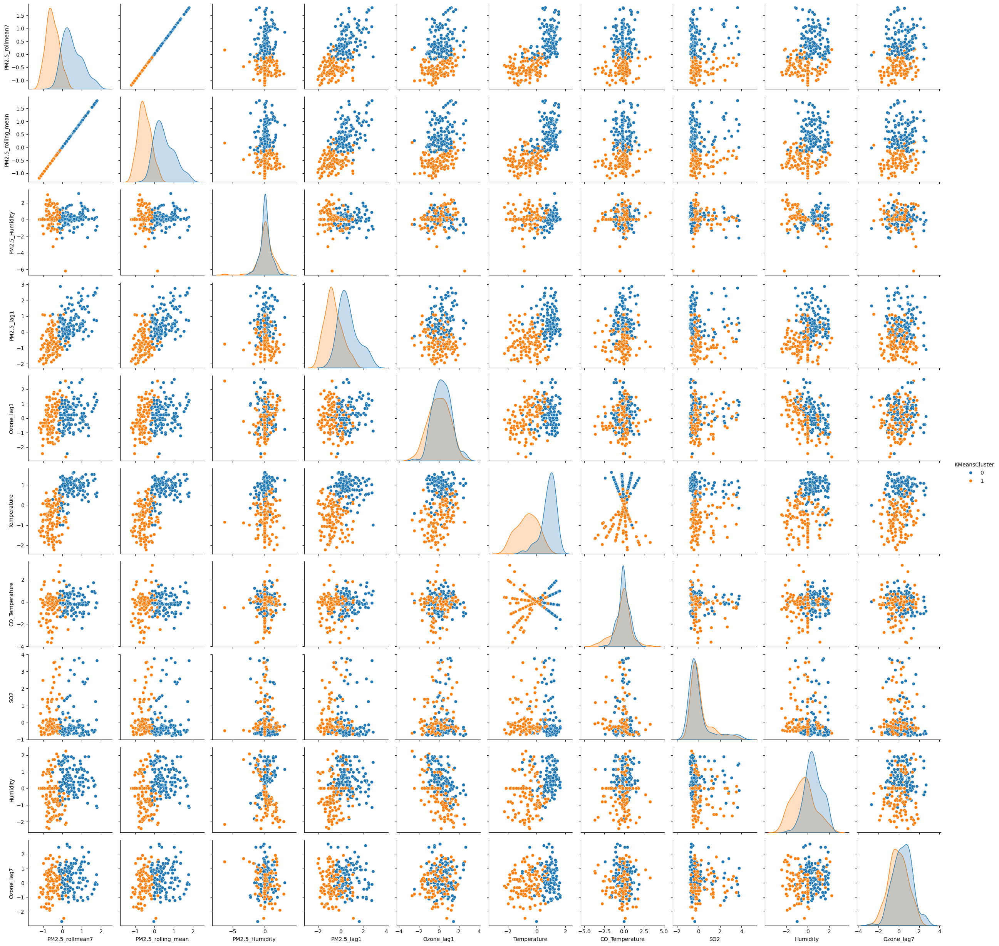

In [117]:
# Visualize the clusters using a pairplot
sns.pairplot(merged_data, hue='KMeansCluster', vars=selected_features)
plt.show()

- hierarchical clustering

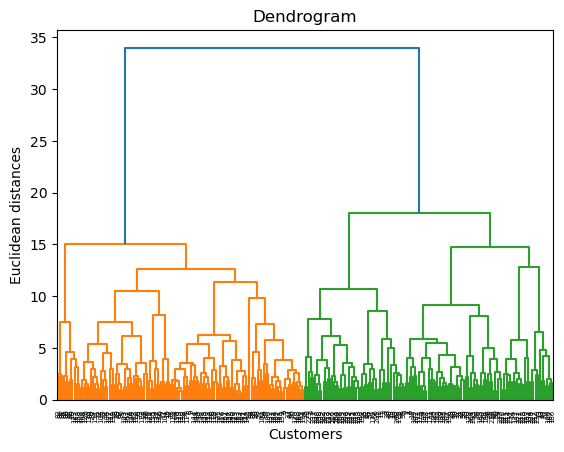

In [119]:
### Using the dendrogram to find the optimal number of clusters
dendrogram = sch.dendrogram(sch.linkage(scaled_features, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [120]:
agg_clustering = AgglomerativeClustering(n_clusters=2)
merged_data['HierarchicalCluster'] = agg_clustering.fit_predict(scaled_features)

In [121]:
### Calculating the performance of the clusters
silhouette_score_hierarchical = round(silhouette_score(scaled_features, merged_data['HierarchicalCluster']),3)
calinski_harabasz_score_hierarchical = round(calinski_harabasz_score(scaled_features, merged_data['HierarchicalCluster']),3)
print('Silhouette Score : {}'.format(silhouette_score_hierarchical))
print('Calinski Harabasz Score : {}'.format(calinski_harabasz_score_hierarchical))

Silhouette Score : 0.219
Calinski Harabasz Score : 75.438


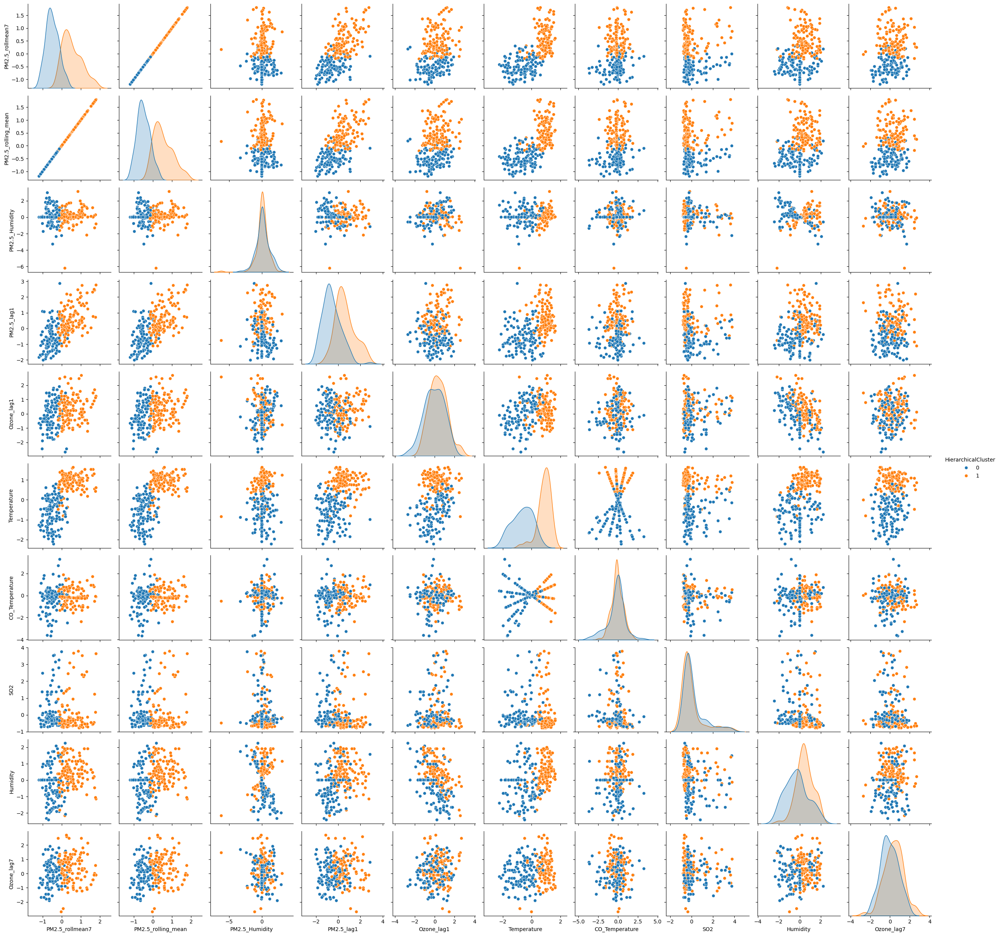

In [122]:
# Visualize the clusters using a pairplot
sns.pairplot(merged_data, hue='HierarchicalCluster', vars=selected_features)
plt.show()

# b) Use DBSCAN for density-based clustering

In [124]:
# Fit DBSCAN (choose epsilon and min_samples based on experimentation)
dbscan = DBSCAN(eps=0.5, min_samples=10)
merged_data['DBSCANCluster'] = dbscan.fit_predict(scaled_features)

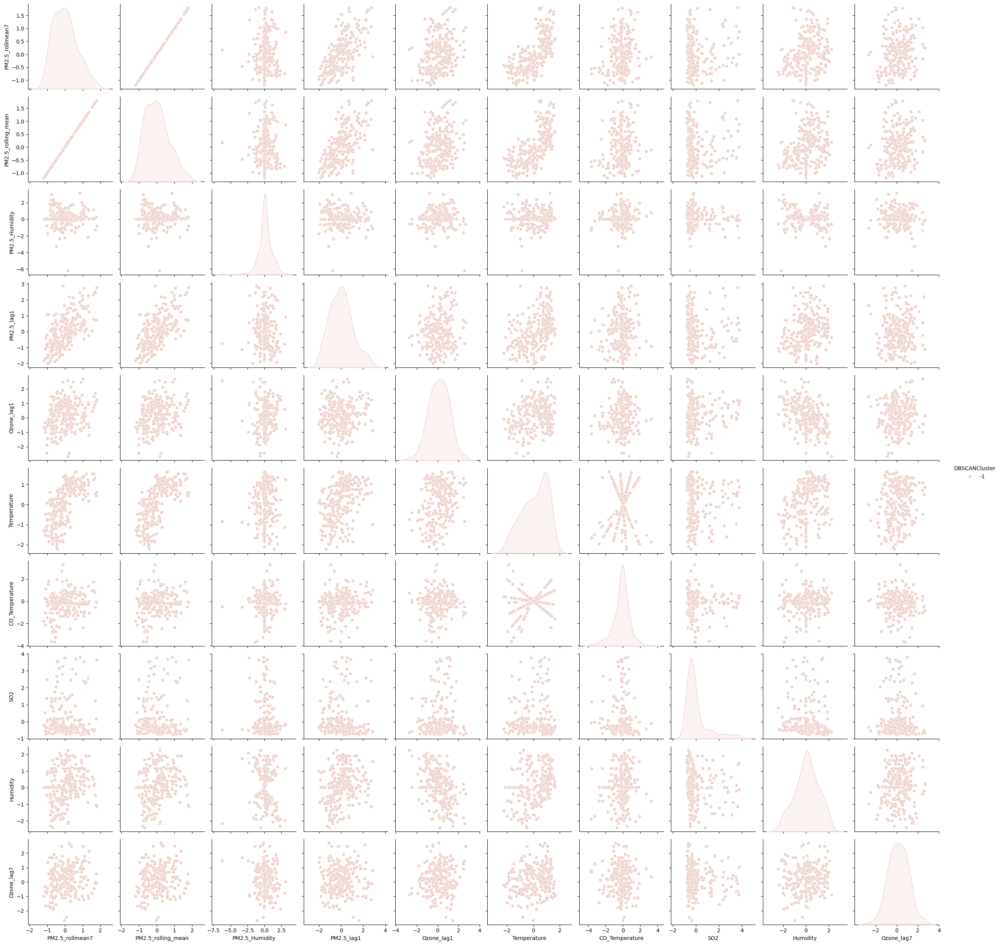

In [125]:
# Visualize the clusters using a pairplot
sns.pairplot(merged_data, hue='DBSCANCluster', vars=selected_features)
plt.show()

# c) Apply PCA and t-SNE for dimensionality reduction

- PCA

In [128]:
# Apply PCA, ,it reduces the dimensionality of the dataset while retaining as much variance as possible.
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
principal_components = pca.fit_transform(scaled_features)
# Create a DataFrame with PCA results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

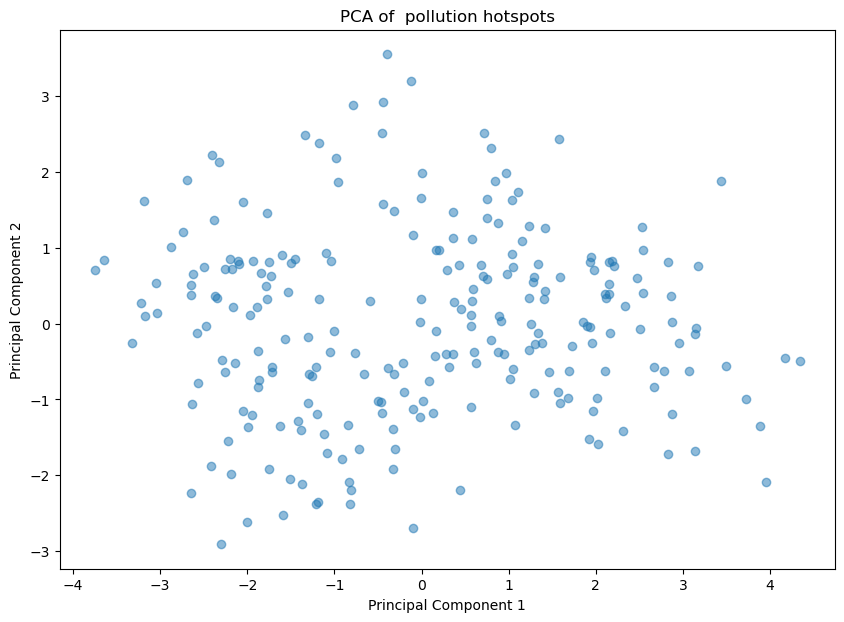

In [129]:
# Visualize the data in 2D
plt.figure(figsize=(10, 7))
plt.scatter(pca_df['PC1'], pca_df['PC2'], alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('PCA of  pollution hotspots')
plt.show()

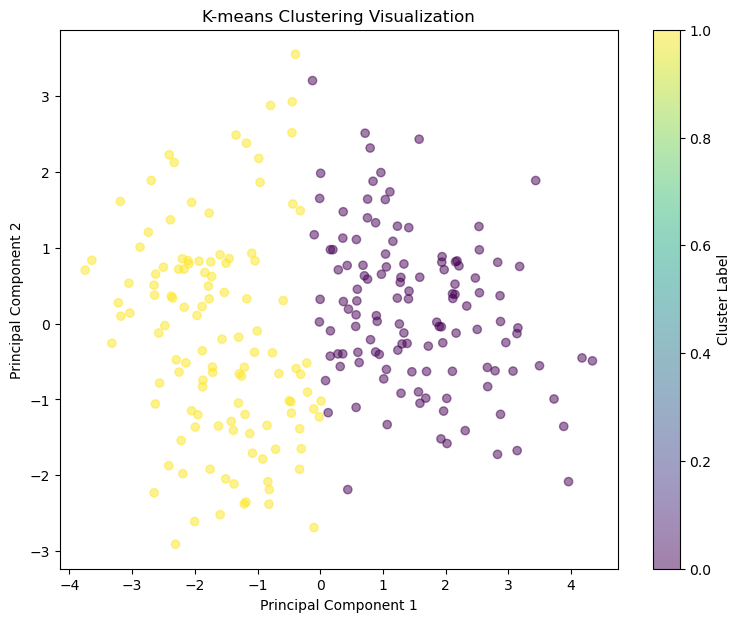

In [130]:
plt.figure(figsize=(9, 7))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=merged_data['KMeansCluster'], cmap='viridis', alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering Visualization')
plt.colorbar(label='Cluster Label')
plt.show()

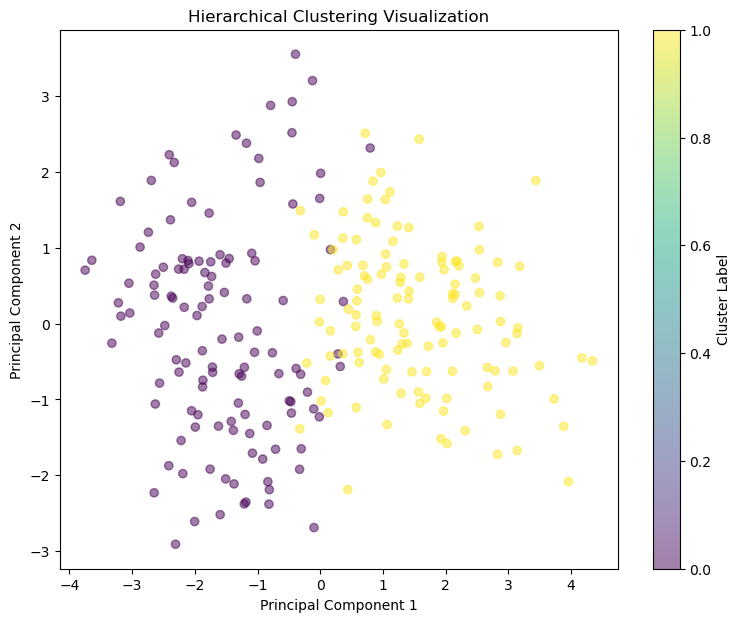

In [131]:
plt.figure(figsize=(9, 7))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=merged_data['HierarchicalCluster'], cmap='viridis', alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Hierarchical Clustering Visualization')
plt.colorbar(label='Cluster Label')
plt.show()

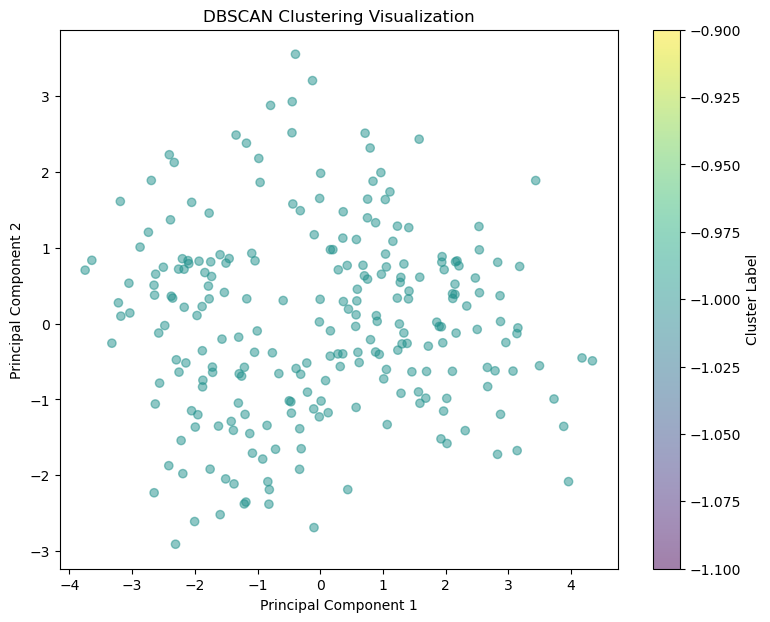

In [132]:
plt.figure(figsize=(9, 7))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=merged_data['DBSCANCluster'], cmap='viridis', alpha=0.5)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('DBSCAN Clustering Visualization')
plt.colorbar(label='Cluster Label')
plt.show()

- t-SNE

In [134]:
# Apply t-SNE for dimensionality reduction
tsne = TSNE(n_components=2)
X_tsne = tsne.fit_transform(scaled_features)

In [135]:
# Create a DataFrame with PCA results
tsne_df = pd.DataFrame(data=principal_components, columns=['tSNE1', 'tSNE2'])

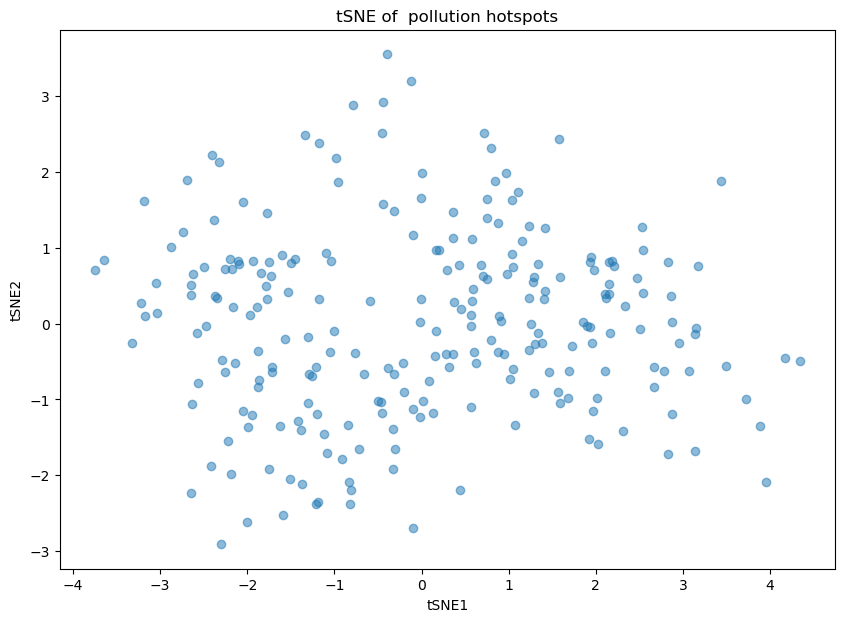

In [136]:
# Visualize the data in 2D
plt.figure(figsize=(10, 7))
plt.scatter(tsne_df['tSNE1'], tsne_df['tSNE2'], alpha=0.5)
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.title('tSNE of  pollution hotspots')
plt.show()

# e) Implement Isolation Forest for anomaly detection

In [138]:
from sklearn.ensemble import IsolationForest
# Apply Isolation Forest
iso_forest = IsolationForest(contamination=0.05, random_state=42)
iso_labels = iso_forest.fit_predict(scaled_features)

In [139]:
# Add Isolation Forest anomaly labels to the DataFrame
merged_data['Anomaly'] = iso_labels

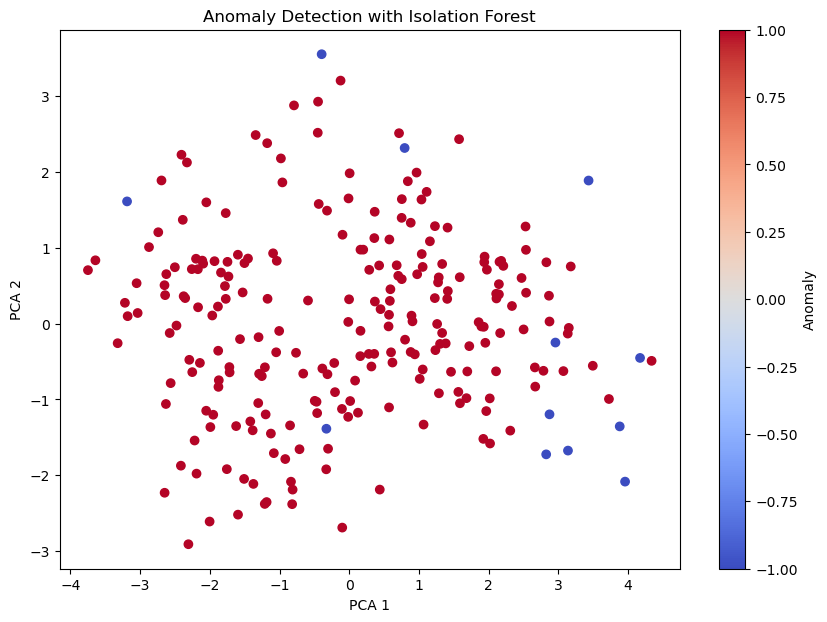

In [140]:
# Visualize anomalies
plt.figure(figsize=(10, 7))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c=iso_labels, cmap='coolwarm')
plt.title('Anomaly Detection with Isolation Forest')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.colorbar(label='Anomaly')
plt.show()

# 5. Supervised Learning - Multi-class Classification: 

# a) Prepare dataset by binning air quality levels into categories.

In [143]:
# Example: Binning PM2.5 levels into categories
bins = [0, 12, 35.4, 55.4, 150.4, 250.4, np.inf]
labels = ['Good', 'Moderate', 'Unhealthy for Sensitive Groups', 'Unhealthy', 'Very Unhealthy', 'Hazardous']
merged_data['PM2.5_Category'] = pd.cut(merged_data['PM2.5'], bins=bins, labels=labels)

# b) Split data into training, validation, and test sets

In [145]:
# Splitting the data
x = merged_data.drop(columns=['Date', 'Source', 'State', 'Season', 'PM2.5_Category'])
y = merged_data['PM2.5_Category']

In [146]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

In [147]:
x_Train, x_Test, y_Train, y_Test = train_test_split(x,y,train_size=.3)

# c) Implement and compare Models

In [149]:
accuracies =[]
def evaluate_model(model, X_Train, y_Train, X_Test, y_Test, model_name):
    model.fit(x_Train, y_Train)
    pre = model.predict(x_Test)


   # Evaluate the model
    accuracy = accuracy_score(y_Test, pre)
    precision = precision_score(y_Test, pre)
    recall = recall_score(y_Test, pre)
    f1 = f1_score(y_Test, pre)
    roc_auc = roc_auc_score(y_Test, pre)
    conf_matrix = confusion_matrix(y_Test, pre)
     
    # Evaluate the model
    print(f"{model_name}")
    print(f"Accuracy: {accuracy}")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1 Score: {f1}")
    print(f"ROC AUC: {roc_auc}")
    print(f"Confusion Matrix:\n {conf_matrix}\n")
    accuracies.append(accuracy)
       # Return the results as a dictionary
    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'ROC AUC': roc_auc,
        'Confusion Matrix': conf_matrix
    }

In [150]:
results = []

In [151]:
# Random Forest
rf = RandomForestClassifier()
results.append(evaluate_model(rf, x_Train, y_Train, x_Test, y_Test, "Random Forest"))

Random Forest
Accuracy: 0.9467455621301775
Precision: 0.9404761904761905
Recall: 0.9518072289156626
F1 Score: 0.9461077844311377
ROC AUC: 0.9468338470159707
Confusion Matrix:
 [[81  5]
 [ 4 79]]



In [152]:
# XGBoost
xgb = XGBClassifier()
results.append(evaluate_model(xgb, x_Train, y_Train, x_Test, y_Test, "XGBoost"))

XGBoost
Accuracy: 0.9881656804733728
Precision: 0.9764705882352941
Recall: 1.0
F1 Score: 0.9880952380952381
ROC AUC: 0.9883720930232558
Confusion Matrix:
 [[84  2]
 [ 0 83]]



In [153]:
# Support Vector Machine
svm = SVC(probability=True)
results.append(evaluate_model(svm,x_Train, y_Train, x_Test, y_Test, "Support Vector Machine"))

Support Vector Machine
Accuracy: 0.4911242603550296
Precision: 0.4911242603550296
Recall: 1.0
F1 Score: 0.6587301587301587
ROC AUC: 0.5
Confusion Matrix:
 [[ 0 86]
 [ 0 83]]



In [154]:
# Gaussian Naive Bayes
gnb = GaussianNB()
results.append(evaluate_model(gnb, x_Train, y_Train, x_Test, y_Test, "Gaussian Naive Bayes"))

Gaussian Naive Bayes
Accuracy: 0.7514792899408284
Precision: 0.759493670886076
Recall: 0.7228915662650602
F1 Score: 0.7407407407407407
ROC AUC: 0.7509806668534604
Confusion Matrix:
 [[67 19]
 [23 60]]



# d) Perform hyperparameter tuning and cross-validation

In [156]:
results_hyper=[]

In [157]:
# Random Forest
rf= RandomForestClassifier(random_state=42)
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
}
rf_cv = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy')
results_hyper.append(evaluate_model(rf_cv,x_Train, y_Train, x_Test, y_Test, "Random Forest"))

Random Forest
Accuracy: 0.9289940828402367
Precision: 0.8901098901098901
Recall: 0.9759036144578314
F1 Score: 0.9310344827586207
ROC AUC: 0.9298122723451948
Confusion Matrix:
 [[76 10]
 [ 2 81]]



In [158]:
# XGBoost
xgb = XGBClassifier(random_state=42)
param_grid_xgb = {
    'learning_rate': [0.01, 0.1, 0.3],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 6, 9]
}
xgb_cv = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='accuracy')
results_hyper.append(evaluate_model(xgb_cv, x_Train, y_Train, x_Test, y_Test, "XGBoost"))

XGBoost
Accuracy: 0.9881656804733728
Precision: 0.9764705882352941
Recall: 1.0
F1 Score: 0.9880952380952381
ROC AUC: 0.9883720930232558
Confusion Matrix:
 [[84  2]
 [ 0 83]]



In [ ]:
# Support Vector Machine
svm = SVC(probability=True, random_state=42)
param_grid_svm = {
    'kernel': ['linear', 'rbf', 'poly'],
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale', 'auto']
}
svm_cv = GridSearchCV(svm, param_grid_svm, cv=5, scoring='accuracy')
results_hyper.append(evaluate_model(svm_cv, x_Train, y_Train, x_Test, y_Test, "Support Vector Machine"))

In [ ]:
# Gaussian Naive Bayes (No hyperparameters to tune)
gnb = GaussianNB()
results_hyper.append(evaluate_model(gnb, x_Train, y_Train, x_Test, y_Test, "Gaussian Naive Bayes"))

# e) Evaluate using accuracy, F1-score, and confusion matrices

In [ ]:
# Convert results to DataFrame
results_df = pd.DataFrame(results_hyper)
# Display the results
print("Evaluation Results:")
print(results_df)

In [ ]:
for result in results_hyper:
    plt.figure(figsize=(4, 2))
    sns.heatmap(result['Confusion Matrix'], annot=True, fmt='d')
    plt.title(f"Confusion Matrix - {result['Model']}")
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()